Importações das bibliotecas necessárias

In [134]:
import sys
import os
import pandas as pd
import numpy as np
from numpy import mean
from numpy import std
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
pd.options.display.float_format = '{:.2f}'.format
import warnings
warnings.filterwarnings('ignore')
from sklearn.utils._testing import ignore_warnings
from sklearn.exceptions import ConvergenceWarning
import pandas_profiling as pp       
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import cross_val_score
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import NuSVC, SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier
from catboost import CatBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.ensemble import StackingClassifier
from mlxtend.classifier import StackingCVClassifier
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.linear_model import LogisticRegression

Carregando os dados no data frame

In [2]:
df = pd.read_csv('../heart.csv/heart.csv')  

Leitura dos 10 primeiros dados do data frame

In [3]:
df.head(10)

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
0,40,M,ATA,140,289,0,Normal,172,N,0.00,Up,0
1,49,F,NAP,160,180,0,Normal,156,N,1.00,Flat,1
2,37,M,ATA,130,283,0,ST,98,N,0.00,Up,0
3,48,F,ASY,138,214,0,Normal,108,Y,1.50,Flat,1
4,54,M,NAP,150,195,0,Normal,122,N,0.00,Up,0
5,39,M,NAP,120,339,0,Normal,170,N,0.00,Up,0
6,45,F,ATA,130,237,0,Normal,170,N,0.00,Up,0
7,54,M,ATA,110,208,0,Normal,142,N,0.00,Up,0
8,37,M,ASY,140,207,0,Normal,130,Y,1.50,Flat,1
9,48,F,ATA,120,284,0,Normal,120,N,0.00,Up,0


Descrição de estatística dos dados: contagem, média, desvio padrão, mínimo, máximo e quartis

In [4]:
df.describe()

,Age,RestingBP,Cholesterol,FastingBS,MaxHR,Oldpeak,HeartDisease
count,918.00,918.00,918.00,918.00,918.00,918.00,918.00
mean,53.51,132.40,198.80,0.23,136.81,0.89,0.55
std,9.43,18.51,109.38,0.42,25.46,1.07,0.50
min,28.00,0.00,0.00,0.00,60.00,-2.60,0.00
25%,47.00,120.00,173.25,0.00,120.00,0.00,0.00
50%,54.00,130.00,223.00,0.00,138.00,0.60,1.00
75%,60.00,140.00,267.00,0.00,156.00,1.50,1.00
max,77.00,200.00,603.00,1.00,202.00,6.20,1.00


Verificando existência e contagem de dados missing

In [5]:
df.isnull().sum()

Age               0
Sex               0
ChestPainType     0
RestingBP         0
Cholesterol       0
FastingBS         0
RestingECG        0
MaxHR             0
ExerciseAngina    0
Oldpeak           0
ST_Slope          0
HeartDisease      0
dtype: int64

Utilizando biblioteca pandas profiling para gerar página output.html com insights para análise dos dados

In [6]:
profile = pp.ProfileReport(df)
profile.to_file("output.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Informações dos dados

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 918 entries, 0 to 917
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Age             918 non-null    int64  
 1   Sex             918 non-null    object 
 2   ChestPainType   918 non-null    object 
 3   RestingBP       918 non-null    int64  
 4   Cholesterol     918 non-null    int64  
 5   FastingBS       918 non-null    int64  
 6   RestingECG      918 non-null    object 
 7   MaxHR           918 non-null    int64  
 8   ExerciseAngina  918 non-null    object 
 9   Oldpeak         918 non-null    float64
 10  ST_Slope        918 non-null    object 
 11  HeartDisease    918 non-null    int64  
dtypes: float64(1), int64(6), object(5)
memory usage: 86.2+ KB


Realizando pré-processamento: transformação de valores alfanuméricos em numéricos

In [7]:
from sklearn.preprocessing import LabelEncoder # importação biblioteca para pré-processamento
le = LabelEncoder()
df1 = df.copy(deep = True) # cópia do data frame df para novo data frame df1

In [8]:
df1['Sex'] = le.fit_transform(df1['Sex'])
df1['ChestPainType'] = le.fit_transform(df1['ChestPainType'])
df1['RestingECG'] = le.fit_transform(df1['RestingECG'])
df1["ExerciseAngina"] = le.fit_transform(df1['ExerciseAngina'])
df1['ST_Slope'] = le.fit_transform(df1['ST_Slope'])


In [9]:
df1.head(10) # verificando data frame alterado df1

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
0,40,1,1,140,289,0,1,172,0,0.00,2,0
1,49,0,2,160,180,0,1,156,0,1.00,1,1
2,37,1,1,130,283,0,2,98,0,0.00,2,0
3,48,0,0,138,214,0,1,108,1,1.50,1,1
4,54,1,2,150,195,0,1,122,0,0.00,2,0
5,39,1,2,120,339,0,1,170,0,0.00,2,0
6,45,0,1,130,237,0,1,170,0,0.00,2,0
7,54,1,1,110,208,0,1,142,0,0.00,2,0
8,37,1,0,140,207,0,1,130,1,1.50,1,1
9,48,0,1,120,284,0,1,120,0,0.00,2,0


In [10]:
#criando variáveis para separar dados em numéricos e categóricos

categorical_features = ['Sex', 'ChestPainType','RestingECG', 'ExerciseAngina', 'FastingBS', 'ST_Slope', 'HeartDisease']
numerical_features = ['Age', 'RestingBP', 'MaxHR', 'Cholesterol','Oldpeak']

Dimensinando os dados em intervalos entre 0 e 1.

In [11]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler
mms = MinMaxScaler() #normalização
ss = StandardScaler() # padronização

df1['Oldpeak'] = mms.fit_transform(df1[['Oldpeak']])
df1['Age'] = ss.fit_transform(df1[['Age']])
df1['RestingBP'] = ss.fit_transform(df1[['RestingBP']])
df1['Cholesterol'] = ss.fit_transform(df1[['Cholesterol']])
df1['MaxHR'] = ss.fit_transform(df1[['MaxHR']])                           

In [12]:
df1.head(10)

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
0,-1.43,1,1,0.41,0.83,0,1,1.38,0,0.30,2,0
1,-0.48,0,2,1.49,-0.17,0,1,0.75,0,0.41,1,1
2,-1.75,1,1,-0.13,0.77,0,2,-1.53,0,0.30,2,0
3,-0.58,0,0,0.30,0.14,0,1,-1.13,1,0.47,1,1
4,0.05,1,2,0.95,-0.03,0,1,-0.58,0,0.30,2,0
5,-1.54,1,2,-0.67,1.28,0,1,1.30,0,0.30,2,0
6,-0.90,0,1,-0.13,0.35,0,1,1.30,0,0.30,2,0
7,0.05,1,1,-1.21,0.08,0,1,0.20,0,0.30,2,0
8,-1.75,1,0,0.41,0.08,0,1,-0.27,1,0.47,1,1
9,-0.58,0,1,-0.67,0.78,0,1,-0.66,0,0.30,2,0


Apresentação gráfica com dados transformados

<Axes: >

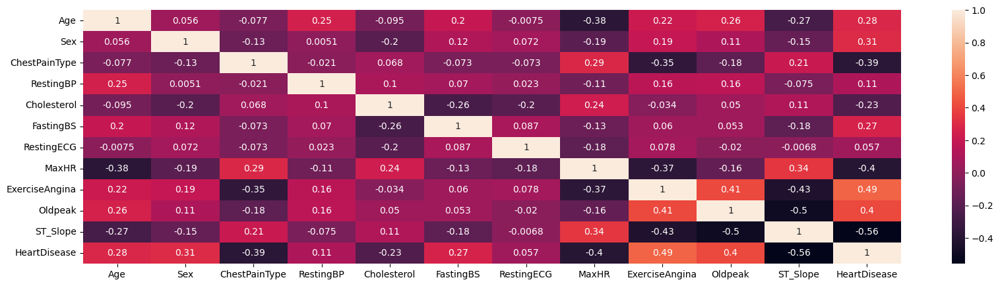

In [13]:
plt.figure(figsize=(20,5))
sns.heatmap(df1.corr(), annot= True)

Utilizando biblioteca SelectKBest para seleção dos dados categóricos relevantes em relação a existência ou não de problemas cardíacos

In [14]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

Text(0.5, 1.0, 'Selection of Categorical features')

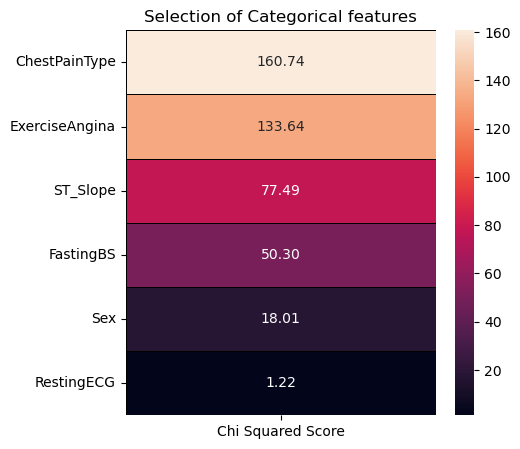

In [15]:
features = df1.loc[:,categorical_features[:-1]]
target = df1['HeartDisease']
best_features = SelectKBest(score_func= chi2,k = 'all')
fit = best_features.fit(features, target)
featureScores = pd.DataFrame(data = fit.scores_, index= list(features.columns), columns= ['Chi Squared Score'])

plt.subplots(figsize = (5,5))
sns.heatmap(featureScores.sort_values(ascending= False, by = 'Chi Squared Score'), annot= True, linewidths= 0.6, linecolor= 'black', fmt = '.2f')
plt.title('Selection of Categorical features')

Dados RestingECG serão desconsiderados uma vez que classificados como pouco relevantes em relação a existência de problemas cardíacos (HeartDisesase)

Classificação de dados numéricos relevantes em relação a problemas cardíacos

Text(0.5, 1.0, 'Selection of numercial Features')

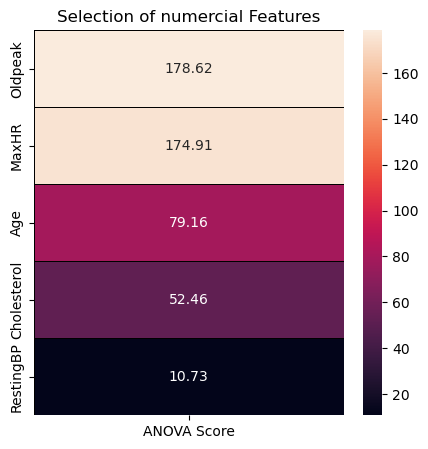

In [16]:
from sklearn.feature_selection import f_classif

features = df1.loc[:,numerical_features]
target = df1['HeartDisease']

best_features = SelectKBest(score_func= f_classif, k = 'all')
fit = best_features.fit(features, target)

featureScores = pd.DataFrame(data = fit.scores_, index= list(features.columns), columns= ['ANOVA Score'])

plt.subplots(figsize = (5,5))
sns.heatmap(featureScores.sort_values(ascending= False, by= 'ANOVA Score'), annot= True, linewidths= 0.6, linecolor= 'black', fmt='.2f')
plt.title('Selection of numercial Features')

Dados da coluna RestinBP considerados pouco relacionados com a existência de doençãs cardíacas e não serão utilizados no treinamento

preparação dados para treino

In [17]:
features = df1[df1.columns.drop(['HeartDisease', 'RestingBP', 'RestingECG'])].values # retirada dos dados RestingECG e RestingBP do treino por serem pouco relevantes, retirada dos dados HeartDisease por serem os dados nos quais o treinamento buscará obter

target = df1['HeartDisease'].values #dados que revelam quanto a existência de doenças cardíacas os quais o modelo tentará prever com base nos outros dados

x_train, x_test, y_train, y_test = train_test_split(features, target, test_size= 0.20, random_state= 42) # separando os dados de treino e dados de teste

Treinando o modelo

Busca melhores parâmetros para Support Vector Machine sendo o resultado: <br>
* {'C': 10, 'gamma': 'auto', 'kernel': 'linear'}

In [18]:
svm = SVC()

In [19]:
param_grid = {'C': [0.1, 1, 10, 100, 1000],
              'gamma': ['auto','scale'],
              'kernel': ['linear', 'poly', 'rbf', 'sigmoid']
              }

In [20]:
gs_svm = GridSearchCV( estimator= svm,
                      param_grid= param_grid,
                      cv = 5,
                      scoring= "roc_auc",
                      refit= True,
                      verbose= 1,
                      n_jobs= -1)

In [22]:
gs_svm.fit(x_train, y_train)

Fitting 5 folds for each of 40 candidates, totalling 200 fits


GridSearchCV(cv=5, estimator=SVC(), n_jobs=-1,
             param_grid={'C': [0.1, 1, 10, 100, 1000],
                         'gamma': ['auto', 'scale'],
                         'kernel': ['linear', 'poly', 'rbf', 'sigmoid']},
             scoring='roc_auc', verbose=1)

In [24]:
gs_svm.best_params_

{'C': 10, 'gamma': 'auto', 'kernel': 'linear'}

Busca melhores parâmetros para classificação com KNeighborsClassifier no qual resultou: <br>
* ({'metric': 'manhattan', 'n_neighbors': 15, 'weights': 'distance'})

In [25]:
knn = KNeighborsClassifier()

In [27]:
knn_params = { 'n_neighbors' : [5,7,9,11,13,15],
              'weights': ['uniform', 'distance'],
              'metric' : ['minkowski', 'euclidean','manhattan']
              }

In [29]:
gs_knn = GridSearchCV(
    estimator= knn,
    param_grid= knn_params,
    cv = 5,
    scoring= "roc_auc",
    refit= True,
    verbose= 1,
    n_jobs= -1
)

In [30]:
gs_knn.fit(x_train, y_train)

Fitting 5 folds for each of 36 candidates, totalling 180 fits


GridSearchCV(cv=5, estimator=KNeighborsClassifier(), n_jobs=-1,
             param_grid={'metric': ['minkowski', 'euclidean', 'manhattan'],
                         'n_neighbors': [5, 7, 9, 11, 13, 15],
                         'weights': ['uniform', 'distance']},
             scoring='roc_auc', verbose=1)

In [31]:
gs_knn.best_params_

{'metric': 'manhattan', 'n_neighbors': 15, 'weights': 'distance'}

Busca melhores parâmetros de classificação para MultiLayer Perceptron, quais sejam: <br>
* {'activation': 'relu', <br>
*  'alpha': 0.005,<br>
*  'early_stopping': True,<br>
* 'hidden_layer_sizes': (50, 30, 20, 30, 10),<br>
*  'learning_rate_init': 0.01,<br>
*  'max_iter': 300,<br>
*  'solver': 'adam'}

In [41]:
mlp_params = {
    'solver' : ['adam'],
    'learning_rate_init': [0.0001,0.01,0.1],
    'max_iter': [300],
    'hidden_layer_sizes': [(50,30,20,30,10), (400,300,200,100), (400,300,200,100,50), (50,4,0,30,20,10), 
                          (20,15,10,5)],
    'activation': ['logistic','tanh','relu'],
    'alpha': [0.0001,0.001,0.005],
    'early_stopping' : [True, False]
}

In [42]:
gs_mlp = GridSearchCV (
    estimator= MLPClassifier(),
    param_grid= mlp_params,
    cv = 5,
    scoring= "roc_auc",
    refit= True,
    verbose = 1,
    n_jobs= -1

)

In [43]:
gs_mlp.fit(x_train, y_train)

Fitting 5 folds for each of 270 candidates, totalling 1350 fits


GridSearchCV(cv=5, estimator=MLPClassifier(), n_jobs=-1,
             param_grid={'activation': ['logistic', 'tanh', 'relu'],
                         'alpha': [0.0001, 0.001, 0.005],
                         'early_stopping': [True, False],
                         'hidden_layer_sizes': [(50, 30, 20, 30, 10),
                                                (400, 300, 200, 100),
                                                (400, 300, 200, 100, 50),
                                                (50, 4, 0, 30, 20, 10),
                                                (20, 15, 10, 5)],
                         'learning_rate_init': [0.0001, 0.01, 0.1],
                         'max_iter': [300], 'solver': ['adam']},
             scoring='roc_auc', verbose=1)

In [44]:
mlp_proba = gs_mlp.predict_proba(x_test)
mlp_score = roc_auc_score(y_test, mlp_proba[:, 1])
print (f"ROC AUC: {mlp_score:.4f}")

ROC AUC: 0.9365


In [45]:
gs_mlp.best_params_

{'activation': 'relu',
 'alpha': 0.005,
 'early_stopping': True,
 'hidden_layer_sizes': (50, 30, 20, 30, 10),
 'learning_rate_init': 0.01,
 'max_iter': 300,
 'solver': 'adam'}

Busca melhores parâmetros classificatórios para RandomForest, neste caso o resultado foi: <br>
* {'criterion': 'entropy',<br>
* 'max_depth': 5,<br>
* 'max_features': 'log2',<br>
* 'n_estimators': 100}<br>

In [47]:
rfc = RandomForestClassifier()

In [48]:
rfc_params = {
    'n_estimators': [100,150,300,500],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth': [4,5,6,7,8],
    'criterion': ['gini','entropy']
}

In [49]:
gs_rfc = GridSearchCV(
    estimator= rfc,
    param_grid= rfc_params,
    cv= 5,
    scoring= "roc_auc",
    refit= True,
    verbose= 1,
    n_jobs= -1
)

In [50]:
gs_rfc.fit(x_train, y_train)

Fitting 5 folds for each of 120 candidates, totalling 600 fits


GridSearchCV(cv=5, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [4, 5, 6, 7, 8],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'n_estimators': [100, 150, 300, 500]},
             scoring='roc_auc', verbose=1)

In [51]:
rfc_proba = gs_rfc.predict_proba(x_test)
rfc_score = roc_auc_score(y_test, rfc_proba[:,1])
print(f"ROC AOC: {rfc_score:.4f}")

ROC AOC: 0.9301


In [52]:
gs_rfc.best_params_

{'criterion': 'entropy',
 'max_depth': 5,
 'max_features': 'log2',
 'n_estimators': 100}

Busca melhores parâmetros de classificação para XGBClassifier. Resultado: <br>
* {'gamma': 1.5,<br>
* 'max_depth': 3,<br>
* 'min_child_weight': 1,<br>
* 'n_estimators': 250,<br>
* 'subsample': 0.8}

In [53]:
xgb = XGBClassifier(learning_rate = 0.02, objective= 'binary:logistic', nthread= 4)

In [55]:
xgb_params = {
    'n_estimators': [100,150,250],
    'min_child_weight': [1,5,10],
    'gamma': [0.5,1,1.5,2],
    'max_depth': [3,4,5],
    'subsample': [0.6,0.8,1.0]
}

In [57]:
gs_xgb = GridSearchCV (
    estimator= xgb,
    param_grid= xgb_params,
    cv = 5,
    scoring= 'roc_auc',
    refit= True,
    verbose= 1
)

In [58]:
gs_xgb.fit(x_train, y_train)

Fitting 5 folds for each of 324 candidates, totalling 1620 fits


GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     gpu_id=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=0.02,...
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None, nthread=4,
                                     num_parallel_tree=None, predictor=None, ...),
             param_grid={'gamma': [0.5, 1, 1.5, 2], 'max_depth': [3, 4, 5],
                         'min_child_weight': [1, 5, 10],
                         'n_estimators': [100, 150, 250],
                         'subsample': [0.6, 0.8, 1.0]},
             scoring='roc_auc', verbose=1)

In [59]:
gs_xgb.best_score_

0.9294028594401729

In [60]:
y_proba = gs_xgb.predict_proba(x_test)

In [61]:
xgb_score = roc_auc_score(y_test, y_proba[:,1])
print(f"ROC AOC: {xgb_score:.4f}")

ROC AOC: 0.9393


In [62]:
gs_xgb.best_params_

{'gamma': 1.5,
 'max_depth': 3,
 'min_child_weight': 1,
 'n_estimators': 250,
 'subsample': 0.8}

Obtendo melhores parâmetros para o classificador CatBoost, resultado: <br>
* {'depth': 6, 'l2_leaf_reg': 1, 'learning_rate': 0.03, 'n_estimators': 300}

In [88]:
cbc = CatBoostClassifier(loss_function='Logloss')

In [89]:
cbc_params = {'learning_rate': [0.03,0.05,0.1],
        'n_estimators' : [50,150,300,500],
        'depth': [4, 6, 10],
        'l2_leaf_reg': [1, 3, 5,7,9]}

In [90]:
gs_cbc = GridSearchCV(  estimator = cbc,
                        param_grid = cbc_params, 
                        cv = 5,
                        scoring = "roc_auc",
                        refit = True,
                        verbose = 1
                     )

In [91]:
gs_cbc.fit(x_train,y_train)

Fitting 5 folds for each of 180 candidates, totalling 900 fits
0:	learn: 0.6781462	total: 151ms	remaining: 7.41s
1:	learn: 0.6636026	total: 153ms	remaining: 3.67s
2:	learn: 0.6508746	total: 154ms	remaining: 2.41s
3:	learn: 0.6391718	total: 155ms	remaining: 1.79s
4:	learn: 0.6298748	total: 156ms	remaining: 1.41s
5:	learn: 0.6183907	total: 158ms	remaining: 1.16s
6:	learn: 0.6067672	total: 159ms	remaining: 979ms
7:	learn: 0.5969787	total: 161ms	remaining: 844ms
8:	learn: 0.5876521	total: 162ms	remaining: 738ms
9:	learn: 0.5781605	total: 163ms	remaining: 653ms
10:	learn: 0.5691454	total: 164ms	remaining: 583ms
11:	learn: 0.5611469	total: 165ms	remaining: 523ms
12:	learn: 0.5535630	total: 167ms	remaining: 474ms
13:	learn: 0.5457422	total: 168ms	remaining: 432ms
14:	learn: 0.5381548	total: 170ms	remaining: 396ms
15:	learn: 0.5312876	total: 171ms	remaining: 363ms
16:	learn: 0.5237258	total: 172ms	remaining: 335ms
17:	learn: 0.5168982	total: 174ms	remaining: 309ms
18:	learn: 0.5108293	total: 1

GridSearchCV(cv=5,
             estimator=<catboost.core.CatBoostClassifier object at 0x0000020A0E4EF3A0>,
             param_grid={'depth': [4, 6, 10], 'l2_leaf_reg': [1, 3, 5, 7, 9],
                         'learning_rate': [0.03, 0.05, 0.1],
                         'n_estimators': [50, 150, 300, 500]},
             scoring='roc_auc', verbose=1)

In [93]:
gs_cbc.best_score_


0.9312709949132005

In [94]:
y_probacbc = gs_cbc.predict_proba(x_test)

In [96]:
cbc_score = roc_auc_score(y_test, y_probacbc[:,1])
print(f"ROC AOC: {cbc_score: .4f}")

ROC AOC:  0.9295


In [97]:
gs_cbc.best_params_

{'depth': 6, 'l2_leaf_reg': 1, 'learning_rate': 0.03, 'n_estimators': 300}

Busca melhores parâmetros para classificador AdaBoost, resultado: <br>
*{'algorithm': 'SAMME.R', 'learning_rate': 0.03, 'n_estimators': 300}

In [98]:
ada = AdaBoostClassifier(random_state= 42)

In [113]:
ada_params = {'learning_rate' : [0.03,0.05,0.07,0.1],
              'n_estimators' : [100,200,300,400,500],
              'algorithm' : ['SAMME', 'SAMME.R']}

In [114]:
gs_ada = GridSearchCV (
    estimator= ada,
    param_grid = ada_params,
    cv = 5,
    scoring= "roc_auc",
    refit= True,
    verbose= 1
)

In [115]:
gs_ada.fit(x_train, y_train)

Fitting 5 folds for each of 40 candidates, totalling 200 fits


GridSearchCV(cv=5, estimator=AdaBoostClassifier(random_state=42),
             param_grid={'algorithm': ['SAMME', 'SAMME.R'],
                         'learning_rate': [0.03, 0.05, 0.07, 0.1],
                         'n_estimators': [100, 200, 300, 400, 500]},
             scoring='roc_auc', verbose=1)

In [116]:
y_proba_ada = gs_ada.predict_proba(x_test)

In [117]:
ada_score = roc_auc_score(y_test, y_proba_ada[:,1])
print(f"ROC AUC: {ada_score: .4f}")

ROC AUC:  0.9268


In [118]:
gs_ada.best_params_

{'algorithm': 'SAMME.R', 'learning_rate': 0.03, 'n_estimators': 300}

Busca melhores parâmetros para algorítimo árvore de decisões, resultado:<br>
* {'criterion': 'entropy', 'max_depth': 5, 'min_samples_leaf': 10}

In [119]:
dt = DecisionTreeClassifier(random_state=42)

In [120]:
dt_params = {
    'max_depth': [2,3,5,10,20],
    'min_samples_leaf':[5,10,20,50,100],
    'criterion':['gini', 'entropy']
}

In [122]:
gs_dt = GridSearchCV(
    estimator= dt,
    param_grid= dt_params,
    cv = 5,
    scoring= "roc_auc",
    verbose = 1,
    refit= True
)

In [124]:
gs_dt.fit(x_train, y_train)

Fitting 5 folds for each of 50 candidates, totalling 250 fits


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=42),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [2, 3, 5, 10, 20],
                         'min_samples_leaf': [5, 10, 20, 50, 100]},
             scoring='roc_auc', verbose=1)

In [125]:
y_proba_dt = gs_dt.predict_proba(x_test)

In [127]:
dt_score = roc_auc_score(y_test, y_proba_dt[:,1])
print(f"ROC AUC: {dt_score:.4f}")

ROC AUC: 0.9261


In [128]:
gs_dt.best_params_

{'criterion': 'entropy', 'max_depth': 5, 'min_samples_leaf': 10}

Busca melhores parâmetros utilizando modelo Naive Bayes, quais sejam: <br>
* {'var_smoothing': 0.0015199110829529332}

In [129]:
nb = GaussianNB()

In [130]:
nb_params = {
    'var_smoothing':np.logspace(0,-9, num=100)
}

In [131]:
gs_nb = GridSearchCV(
    estimator= nb,
    param_grid= nb_params,
    refit= True,
    cv = 5,
    verbose= 1,
    scoring= "roc_auc"
)

In [132]:
gs_nb.fit(x_train, y_train)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


GridSearchCV(cv=5, estimator=GaussianNB(),
             param_grid={'var_smoothing': array([1.00000000e+00, 8.11130831e-01, 6.57933225e-01, 5.33669923e-01,
       4.32876128e-01, 3.51119173e-01, 2.84803587e-01, 2.31012970e-01,
       1.87381742e-01, 1.51991108e-01, 1.23284674e-01, 1.00000000e-01,
       8.11130831e-02, 6.57933225e-02, 5.33669923e-02, 4.32876128e-02,
       3.51119173e-02, 2.84803587e-02, 2.31...
       1.23284674e-07, 1.00000000e-07, 8.11130831e-08, 6.57933225e-08,
       5.33669923e-08, 4.32876128e-08, 3.51119173e-08, 2.84803587e-08,
       2.31012970e-08, 1.87381742e-08, 1.51991108e-08, 1.23284674e-08,
       1.00000000e-08, 8.11130831e-09, 6.57933225e-09, 5.33669923e-09,
       4.32876128e-09, 3.51119173e-09, 2.84803587e-09, 2.31012970e-09,
       1.87381742e-09, 1.51991108e-09, 1.23284674e-09, 1.00000000e-09])},
             scoring='roc_auc', verbose=1)

In [133]:
gs_nb.best_params_

{'var_smoothing': 0.0015199110829529332}

Merlhores parâmetros Logistic Regression: <br>
* C=29.763514416313132, max_iter=4, penalty='none', solver='sag'

In [142]:
lr = LogisticRegression()

In [143]:
lr_params = [
    {
        'penalty':['l1','l2','elasticnet','none'],
        'C': np.logspace(-4,4,20),
        'solver': ['lbfgs','newton-cg','liblinear','sag','saga'],
        'max_iter':[1,2,3,4,5,6,7,8,9,10]
    }
]

In [144]:
gs_lr = GridSearchCV(
    estimator= lr,
    param_grid= lr_params,
    cv = 5,
    verbose= 1,
    refit= True,
    scoring= 'roc_auc'
)

In [145]:
gs_lr.fit(x_train, y_train)

Fitting 5 folds for each of 4000 candidates, totalling 20000 fits


GridSearchCV(cv=5, estimator=LogisticRegression(),
             param_grid=[{'C': array([1.00000000e-04, 2.63665090e-04, 6.95192796e-04, 1.83298071e-03,
       4.83293024e-03, 1.27427499e-02, 3.35981829e-02, 8.85866790e-02,
       2.33572147e-01, 6.15848211e-01, 1.62377674e+00, 4.28133240e+00,
       1.12883789e+01, 2.97635144e+01, 7.84759970e+01, 2.06913808e+02,
       5.45559478e+02, 1.43844989e+03, 3.79269019e+03, 1.00000000e+04]),
                          'max_iter': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
                          'penalty': ['l1', 'l2', 'elasticnet', 'none'],
                          'solver': ['lbfgs', 'newton-cg', 'liblinear', 'sag',
                                     'saga']}],
             scoring='roc_auc', verbose=1)

In [146]:
y_proba_lr = gs_lr.predict_proba(x_test)

In [149]:
lr_score = roc_auc_score(y_test, y_proba_lr[:,1])
print(f"ROC AUC {lr_score:.4f}")

ROC AUC 0.9008


In [150]:
gs_lr.best_estimator_

LogisticRegression(C=29.763514416313132, max_iter=4, penalty='none',
                   solver='sag')

Melhores parâmetros modelo LightGBM: <br>
* {'lambda_11': 0,
* 'lambda_12': 0,
* 'min_data_in_leaf': 50,
* 'num_leaves': 5,
* 'reg_alpha': 0.1}

In [152]:
lgbm = LGBMClassifier()

In [153]:
lgbm_params = {
    'num_leaves':[5,10,20,30,50,100],
    'reg_alpha':[0.1,0.5],
    'min_data_in_leaf':[30,50,100,300,400],
    'lambda_11':[0,1,1.5],
    'lambda_12':[0,1]
}

In [154]:
gs_lgbm = GridSearchCV(
    estimator= lgbm,
    param_grid= lgbm_params,
    cv = 5,
    refit=True,
    verbose= 1,
    scoring= 'roc_auc'
)

In [155]:
gs_lgbm.fit(x_train, y_train, verbose= False)

Fitting 5 folds for each of 360 candidates, totalling 1800 fits
[LightGBM] [Warning] Unknown parameter: lambda_11
[LightGBM] [Warning] Unknown parameter: lambda_12
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] Unknown parameter: lambda_11
[LightGBM] [Warning] Unknown parameter: lambda_12
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] Unknown parameter: lambda_11
[LightGBM] [Warning] Unknown parameter: lambda_12
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] Unknown parameter: lambda_11
[LightGBM] [Warning] Unknown parameter: lambda_12
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] Unknown parameter: lambda_1

GridSearchCV(cv=5, estimator=LGBMClassifier(),
             param_grid={'lambda_11': [0, 1, 1.5], 'lambda_12': [0, 1],
                         'min_data_in_leaf': [30, 50, 100, 300, 400],
                         'num_leaves': [5, 10, 20, 30, 50, 100],
                         'reg_alpha': [0.1, 0.5]},
             scoring='roc_auc', verbose=1)

In [156]:
y_proba_lgbm = gs_lgbm.predict_proba(x_test)

In [158]:
lgbm_score = roc_auc_score(y_test, y_proba_lgbm[:,1])
print(f"ROC AUC: {lgbm_score:.4f}")

ROC AUC: 0.9379


In [159]:
gs_lgbm.best_estimator_

LGBMClassifier(lambda_11=0, lambda_12=0, min_data_in_leaf=50, num_leaves=5,
               reg_alpha=0.1)

In [160]:
gs_lgbm.best_params_

{'lambda_11': 0,
 'lambda_12': 0,
 'min_data_in_leaf': 50,
 'num_leaves': 5,
 'reg_alpha': 0.1}

Utilizando Stacking Classifier com os melhores parâmetros obtidos de cada modelos

In [174]:
def get_stacking():
    level0 = list() #empilhamento de todos os modelos com seus melhores parâmetros
    level0.append(('lr', LogisticRegression(C=29.763514416313132, max_iter=4, penalty='none',
                   solver='sag')))
    level0.append(('knn', KNeighborsClassifier(metric= 'manhattan', n_neighbors= 15, weights = 'distance')))
    level0.append(('dt', DecisionTreeClassifier(criterion= 'entropy', max_depth= 5, min_samples_leaf= 10, random_state=42)))
    level0.append(('svm', SVC(C = 10, gamma= 'auto', kernel= 'linear')))
    level0.append(('ada', AdaBoostClassifier(algorithm= 'SAMME.R', learning_rate= 0.03, n_estimators=300)))
    level0.append(('cat', CatBoostClassifier(depth= 6, l2_leaf_reg= 1, learning_rate= 0.03, n_estimators= 300, verbose= False)))
    level0.append(('mlp', MLPClassifier(activation= 'relu', alpha= 0.005, early_stopping= True, 
                                        hidden_layer_sizes= (50, 30, 20, 30, 10), learning_rate_init= 0.01, 
                                        max_iter= 300, solver= 'adam')))
    level0.append(('xgb', XGBClassifier(gamma= 1.5,max_depth= 3,min_child_weight= 1,n_estimators= 250,subsample= 0.8,
                                        learning_rate=0.02)))
    level0.append(('nb', GaussianNB(var_smoothing= 0.0015199110829529332)))
    level0.append(('rfc', RandomForestClassifier(criterion= 'entropy',max_depth= 5,max_features= 'log2',n_estimators= 100)))

# classificador para cálculo da previsão final
    level1 = GaussianNB(var_smoothing= 0.0015199110829529332)

    model = StackingClassifier(estimators= level0, final_estimator= level1, passthrough= True, stack_method='auto')
    return model #retorna o resultado da classificação final do empilhamento

In [175]:
def get_models():
    models = dict() #dicionário contendo todos os modelos com seus melhore parâmetros
    models['cat'] = CatBoostClassifier(depth= 6, l2_leaf_reg= 1, learning_rate= 0.03, n_estimators= 300, verbose= False)
    models['lr'] = LogisticRegression(C=29.763514416313132, max_iter=4, penalty='none', solver='sag')
    models['knn'] = KNeighborsClassifier(metric= 'manhattan', n_neighbors= 15, weights = 'distance')
    models['dt'] = DecisionTreeClassifier(criterion= 'entropy', max_depth= 5, min_samples_leaf= 10, random_state=42)
    models['svm'] = SVC(C = 10, gamma= 'auto', kernel= 'linear')
    models['ada'] = AdaBoostClassifier(algorithm= 'SAMME.R', learning_rate= 0.03, n_estimators=300)
    models['cat'] = CatBoostClassifier(depth= 6, l2_leaf_reg= 1, learning_rate= 0.03, n_estimators= 300, verbose= False)
    models['mlp'] = MLPClassifier(activation= 'relu', alpha= 0.005, early_stopping= True, 
                                        hidden_layer_sizes= (50, 30, 20, 30, 10), learning_rate_init= 0.01, 
                                        max_iter= 300, solver= 'adam')
    models['xgb'] = XGBClassifier(gamma= 1.5,max_depth= 3,min_child_weight= 1,n_estimators= 250,subsample= 0.8,
                                        learning_rate=0.02)
    models['nb'] = GaussianNB(var_smoothing= 0.0015199110829529332)
    models['rf'] = RandomForestClassifier(criterion= 'entropy',max_depth= 5,max_features= 'log2',n_estimators= 100)
    models['stacking'] = get_stacking() # resultado do empilhamento 
    return models



In [176]:
def evaluate_model(model, X, y): #função que retorna score de cada um dos modelos
    cv = RepeatedStratifiedKFold(n_splits= 5, n_repeats= 3, random_state=0)
    scores = cross_val_score(model, X, y, scoring= 'roc_auc', cv= cv, n_jobs=1, error_score='raise')
    return scores

In [177]:
models = get_models() 

In [178]:
if not sys.warnoptions: #função para ignorar erros
    warnings.simplefilter('ignore')
    os.environ['PYTHONWARNINGS'] = ('ignore::UserWarning,ignore::ConvergenceWarning,ignore::RuntimeWarning')

ROC AUC [cat]: 0.932 +/- 0.019
ROC AUC [lr]: 0.912 +/- 0.024
ROC AUC [knn]: 0.923 +/- 0.023
ROC AUC [dt]: 0.900 +/- 0.024
ROC AUC [svm]: 0.911 +/- 0.025
ROC AUC [ada]: 0.926 +/- 0.023
ROC AUC [mlp]: 0.923 +/- 0.020
ROC AUC [xgb]: 0.936 +/- 0.020
ROC AUC [nb]: 0.913 +/- 0.025
ROC AUC [rf]: 0.930 +/- 0.022
ROC AUC [stacking]: 0.932 +/- 0.022


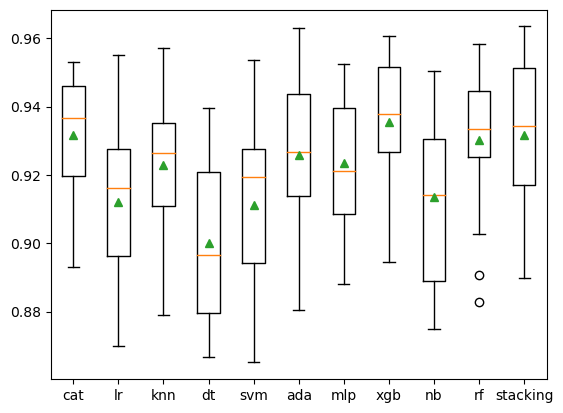

In [179]:
results, names = list(), list() 
''' estrutura de repetição "for" que para cada um dos scores e nomes retornados pela função "evaluate_mode" adiciona
a reespectiva lista "results" e 'names' bem como os imprime na tela a média e desvio padrão dos scores.

'''
for name, model in models.items():
    scores = evaluate_model(model, features, target)
    results.append(scores)
    names.append(name)
    print('ROC AUC [%s]: %.3f +/- %.3f' %(name, mean(scores), std(scores)))

#apresentação em boxplot
plt.boxplot(results, labels= names, showmeans= True)
plt.show()